In [1]:
import os
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader, random_split, ConcatDataset
import pytorch_lightning as pl
from pytorch_lightning import Trainer
from torch import nn
from torch.optim import Adam
from torchvision.transforms import  Compose, ToTensor, Resize, RandomHorizontalFlip, RandomRotation, ColorJitter, RandomResizedCrop, Lambda
from PIL import Image
import matplotlib.pyplot as plt
from torchsummary import summary
import torchmetrics
from lightning.pytorch.loggers import WandbLogger
import wandb
import random
from datetime import datetime
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping

/home/torgeschwark/miniconda3/envs/MLubu/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
print("CUDA verfügbar:", torch.cuda.is_available())
print("CUDA-Version:", torch.version.cuda)
print("GPU-Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "Keine GPU gefunden")

if torch.cuda.is_available():
    device = torch.device("cuda")
    num_workers = 10


CUDA verfügbar: True
CUDA-Version: 12.4
GPU-Name: NVIDIA GeForce RTX 3070 Ti


In [3]:
# Dataset Path
DATASET_PATHS = ["./generated_images"]
PRICES_FILE_PATH = "../Dataset/prices.txt"
IMAGE_SIZE = (200, 200)
BATCH_SIZE = 32
SEED = 42

In [4]:
from lightning.pytorch import seed_everything

np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
seed_everything(SEED)

Seed set to 42


42

In [5]:
import helper_functions as hp
num_classes = 3


In [6]:
class ImagePriceDataset(Dataset):
    def __init__(self, dataset_paths, transform=None):
        self.files = []
        for dataset_path in dataset_paths:
            if not os.path.exists(dataset_path):
                raise ValueError(f"Path {dataset_path} doesn't exist.")
            for f in os.listdir(dataset_path):
                if f.endswith(".png"):
                    self.files.append((f, dataset_path))
        
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        file_name, dataset_path = self.files[idx]
        image, label = hp.load_generated_images(file_name, dataset_path, IMAGE_SIZE, num_classes)

        # Wenn das Bild im float32 Format vorliegt, skaliere es und wandle es in uint8 um
        if image.dtype == np.float32:
            image = (image * 255).astype(np.uint8)  # Skalieren auf [0, 255] und in uint8 umwandeln

        # Konvertiere das numpy-Array in ein PIL-Image
        image = Image.fromarray(image)

        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.float32)
    
# Transforms
transform = Compose([
    Lambda(lambda x: hp.custom_augmentation(x)),
    RandomHorizontalFlip(p=0.5),       # Zufälliges horizontales Spiegeln mit 50% Wahrscheinlichkeit
    RandomRotation(degrees=180),        # Zufällige Rotation um bis zu ±15 Grad
    ColorJitter(brightness=0.04,        # Zufällige Anpassung der Helligkeit
                contrast=0.1,          # Kontrast
                saturation=0.2,        # Sättigung
                hue=0.07),              # Farbton
    ToTensor()                         # Konvertiere das Bild zu einem Tensor
])

transform_test = Compose([
    ToTensor()                         # Konvertiere das Bild zu einem Tensor
])


# Dataset
dataset = ImagePriceDataset(DATASET_PATHS, transform=transform)

# Berechne die Größe für den Split
print(len(dataset))
train_size = int(0.7 * len(dataset))
val_size = int(0.2 * len(dataset))  # 20% für Validation
test_size = len(dataset) - train_size - val_size  # Der Rest für Test (10%)

# Splitte den Datensatz in Training, Validation und Test
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# DataLoader
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_workers)

print(f"Training set size: {len(train_loader.dataset)} samples")
print(f"Validation set size: {len(val_loader.dataset)} samples")
print(f"Test set size: {len(test_loader.dataset)} samples")



1000
Training set size: 700 samples
Validation set size: 200 samples
Test set size: 100 samples


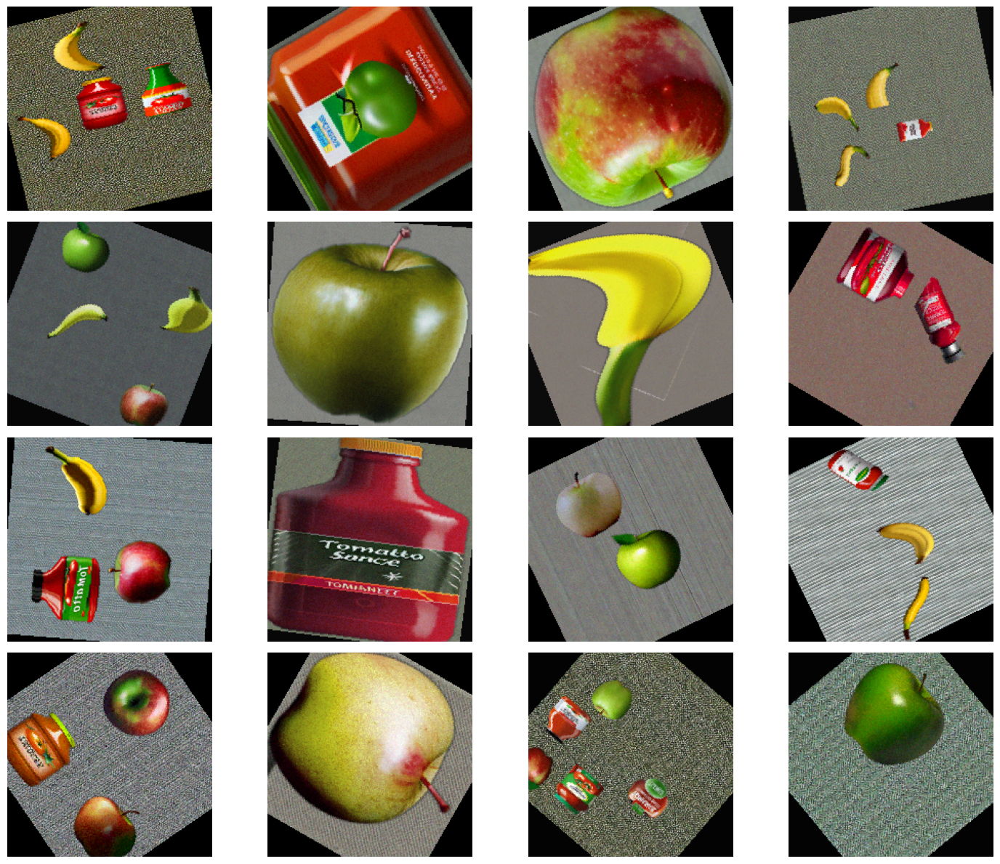

In [7]:
import matplotlib.pyplot as plt
import numpy as np

# Funktion zum Anzeigen von Bildern
def imshow(image, ax=None):
    # Wenn kein Ax angegeben wird, erstelle eine neue Achse
    if ax is None:
        fig, ax = plt.subplots()
        
    # Wandle den Tensor in ein NumPy-Array um und skaliere die Werte zurück auf [0, 1]
    image = image.permute(1, 2, 0).numpy()  # Von (C, H, W) nach (H, W, C)
    image = np.clip(image, 0, 1)  # Begrenze den Wertebereich auf [0, 1]
    
    ax.imshow(image)
    ax.axis('off')

# Hole ein Batch von Bildern aus dem DataLoader
data_iter = iter(train_loader)
images, labels = next(data_iter)

# Zeige die ersten 5 Bilder im Batch
fig, axes = plt.subplots(4, 4, figsize=(15, 12))  # 4 Zeilen, 5 Spalten
axes = axes.flatten()  # Flatten der 2D Achsenmatrix, um sie einfach zu durchlaufen

# Zeige die Bilder
for i in range(16):
    imshow(images[i], axes[i])  # Stelle jedes Bild in der jeweiligen Achse dar

# Zeige die Bilder
plt.tight_layout()  # Optimiert das Layout für bessere Übersicht
plt.show()


In [15]:
import torch
import random
import matplotlib.pyplot as plt
import wandb

def show_predictions_with_prices_and_manual_metrics(model, test_dataset, num_samples=20, threshold=0.5):
    model.eval()  # Setze das Modell in den Evaluierungsmodus
    samples = random.sample(range(len(test_dataset)), num_samples)  # Wähle zufällig Samples aus

    all_true_prices = []
    all_predicted_prices = []

    for idx in samples:
        image, labels = test_dataset[idx]  # Lade das Bild und die Multi-Label Labels
        image_tensor = image.unsqueeze(0).to(model.device)  # Füge Batch-Dimension hinzu und verschiebe auf GPU/CPU

        # Vorhersage erzeugen
        with torch.no_grad():
            prediction = model(image_tensor).cpu().squeeze()  # Entferne die Batch-Dimension und bringe auf CPU

        # Erstelle ein Dictionary für Vorhersagen über dem Schwellenwert
    

        # Bild anzeigen
        print(prediction, labels)
        plt.figure(figsize=(6, 6))
        plt.imshow(image.permute(1, 2, 0))  # Konvertiere das Tensor-Bild in HWC-Format
        plt.axis("off")
        plt.show()

        try:
            wandb.log({"predictions": wandb.Image(plt)})
        except Exception as e:
            print(f"Couldn't log predictions to wandb: {e}")

    # Manuelle Berechnung von MSE und MAE
    mse = sum((true - pred) ** 2 for true, pred in zip(all_true_prices, all_predicted_prices)) / len(all_true_prices)
    mae = sum(abs(true - pred) for true, pred in zip(all_true_prices, all_predicted_prices)) / len(all_true_prices)

    # MSE und MAE ausgeben
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Mean Absolute Error (MAE): {mae:.2f}")

    return mse, mae




def configure_wandb(additional_name="", tags=[]):
    # Sort the dataset names aplhabetically
    dataset_names = "-".join(sorted([os.path.basename(path) for path in DATASET_PATHS]))
    group = "Regression-"+dataset_names
    name = dataset_names+additional_name+"_"+datetime.now().strftime("%d%b-%H:%M:%S")

    wandb_logger = WandbLogger(project="TinyML-CartDetection", group=group, name=name, tags=tags)   
    wandb_logger.experiment.config.update({"batch_size": BATCH_SIZE, "image_size": IMAGE_SIZE, "seed": SEED}) # Log additional hyperparameters

    return wandb_logger

In [9]:
checkpoint_callback = ModelCheckpoint(
    monitor='val_loss',   # Track validation loss
    dirpath='checkpoints/',  # Directory to save checkpoints
    filename='best-checkpoint',  # Checkpoint file name
    save_top_k=1,  # Save only the best model (lowest val_loss)
    mode='min',  # We are minimizing validation loss
)

early_stopping = EarlyStopping(
    monitor="val_loss",  
    mode="min",      
    min_delta=0.1,
    patience=5,          
    verbose=True       
)

In [10]:
class TrainModel(pl.LightningModule):
    def __init__(self, model, learning_rate=1e-3, optimizer=None):
        super().__init__()
        
        self.learning_rate = learning_rate
        self.model = model
        self.criterion = nn.MSELoss()
        self.mae = torchmetrics.MeanAbsoluteError()
        self.mse = torchmetrics.MeanSquaredError()
        self.optimizer = optimizer
        self.threshold = 0.5
        self.save_hyperparameters() #ignore=['model']

    def forward(self, x):
        return self.model(x)

    def step(self, batch, stage):
        x, y = batch
        y_pred = self(x)  # Vorhersagen
        # Hauptverlust berechnen (MSE auf allen Labels)
        loss = self.criterion(y_pred, y)

        # MAE und MSE der Hauptlabels
        mae = self.mae(y_pred, y)
        mse = self.mse(y_pred, y)

        # Logs für Progress-Bar und Training/Validierung/Test
        self.log(f"{stage}_loss", loss, prog_bar=True, on_epoch=True)
        self.log(f"{stage}_mae", mae, prog_bar=True, on_epoch=True)
        self.log(f"{stage}_mse", mse, prog_bar=True, on_epoch=True)

        return loss

    def training_step(self, batch, batch_idx):
        return self.step(batch, stage="train")

    def validation_step(self, batch, batch_idx):
        return self.step(batch, stage="val")

    def test_step(self, batch, batch_idx):
        return self.step(batch, stage="test")

    def configure_optimizers(self):
        if self.optimizer is None:
            self.optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        
        # Scheduler erstellen
        scheduler = torch.optim.lr_scheduler.StepLR(self.optimizer, step_size=5, gamma=0.965)
        return [self.optimizer], [scheduler]


In [11]:
from torchvision.models import efficientnet_b0

def getEfficientnetRegression():
    # Load EfficientNet-B0 with pretrained weights
    model = efficientnet_b0(weights="IMAGENET1K_V1")
    print(model)

    # Replace head
    output = model.features[-1][0].out_channels  # Output channels of the last block

    # Define custom regression head
    regression_head = nn.Sequential(
        nn.Linear(output, 200),  # Adjust input size as needed
        nn.ReLU(),
        nn.Linear(200, 200),
        nn.ReLU(),
        nn.Linear(200, 100),
        nn.ReLU(),
        nn.Linear(100, num_classes)
    )

    # Replace the classifier with your regression head
    model.classifier = regression_head
    return model

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

/home/torgeschwark/miniconda3/envs/MLubu/lib/python3.12/site-packages/pytorch_lightning/utilities/parsing.py:209: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/home/torgeschwark/miniconda3/envs/MLubu/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /home/torgeschwark/TinyML-MT/test_aproaches/checkpoints/classifier exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name      | Type              | Params | Mode 
--------------------------------------------------------
0 | model     | EfficientNet      | 4.3 M  | train
1 | criterion | MSELoss           | 0      | train
2 | mae       | MeanAbsoluteError | 0      | train
3 | mse       | MeanSquaredError  | 0      | train
--------------------------------------------------------
4.3 M     Trainable params
0         Non-trainable params
4.3 M     Total params
17.297    Total estimated model params size (MB)
345       Modules in train mode
0         Modules in eval mode


/home/torgeschwark/miniconda3/envs/MLubu/lib/python3.12/site-packages/pytorch_lightning/loops/fit_loop.py:310: The number of training batches (22) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Epoch 9: 100%|██████████| 22/22 [00:03<00:00,  5.72it/s, v_num=7bv1, train_loss_step=0.0534, train_mae_step=0.153, train_mse_step=0.0534, val_loss=0.0363, val_mae=0.123, val_mse=0.0363, train_loss_epoch=0.0375, train_mae_epoch=0.120, train_mse_epoch=0.0375] 

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 22/22 [00:03<00:00,  5.71it/s, v_num=7bv1, train_loss_step=0.0534, train_mae_step=0.153, train_mse_step=0.0534, val_loss=0.0363, val_mae=0.123, val_mse=0.0363, train_loss_epoch=0.0375, train_mae_epoch=0.120, train_mse_epoch=0.0375]


Restoring states from the checkpoint path at /home/torgeschwark/TinyML-MT/test_aproaches/checkpoints/classifier/generated_images_Efficientnet-classifier-generated_images_30Jan-15:32:36.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at /home/torgeschwark/TinyML-MT/test_aproaches/checkpoints/classifier/generated_images_Efficientnet-classifier-generated_images_30Jan-15:32:36.ckpt


Testing DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 36.58it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   0.019381359219551086    │
│         test_mae          │    0.08900302648544312    │
│         test_mse          │   0.019381359219551086    │
└───────────────────────────┴───────────────────────────┘

tensor([ 0.9982,  0.0070, -0.0050]) tensor([1., 0., 0.])


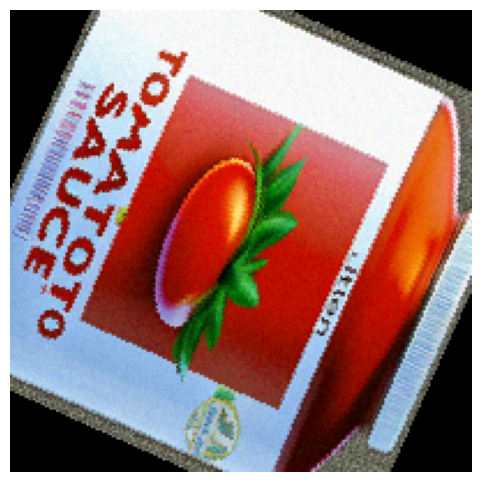

tensor([ 0.0058,  0.8919, -0.0126]) tensor([0., 1., 0.])


<Figure size 640x480 with 0 Axes>

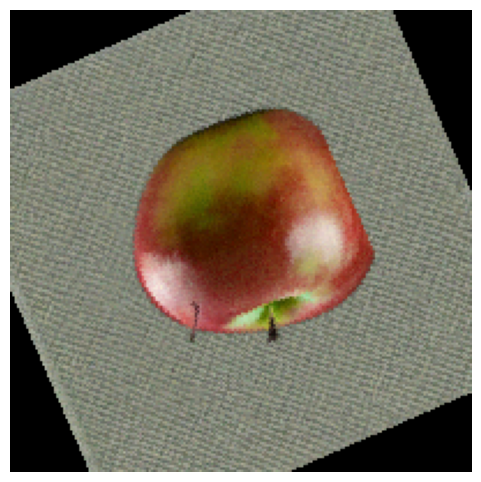

tensor([1.0072, 0.0310, 0.0169]) tensor([1., 0., 0.])


<Figure size 640x480 with 0 Axes>

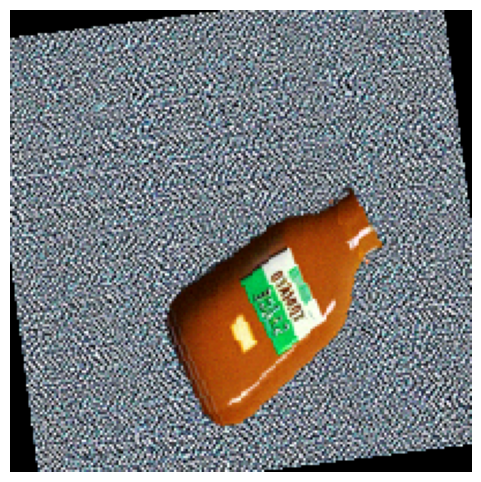

tensor([3.1247, 1.0437, 1.1571]) tensor([3., 1., 1.])


<Figure size 640x480 with 0 Axes>

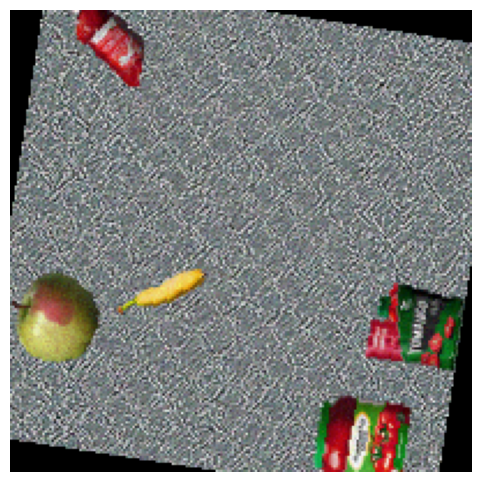

tensor([3.0202, 0.0390, 1.2414]) tensor([3., 0., 1.])


<Figure size 640x480 with 0 Axes>

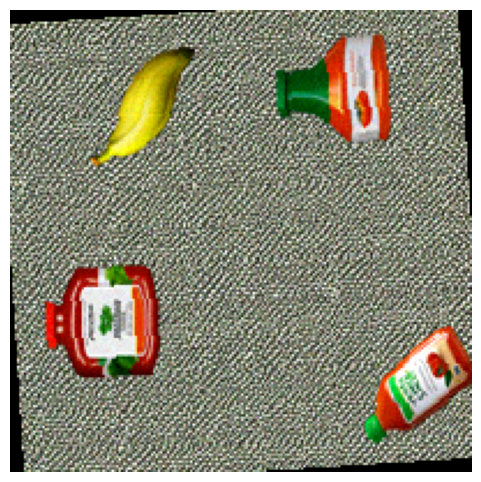

tensor([1.1169, 0.9885, 2.1669]) tensor([1., 1., 2.])


<Figure size 640x480 with 0 Axes>

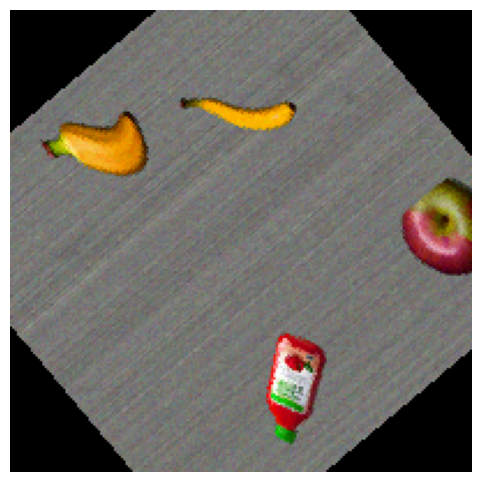

tensor([1.1170, 0.9642, 2.3949]) tensor([1., 1., 2.])


<Figure size 640x480 with 0 Axes>

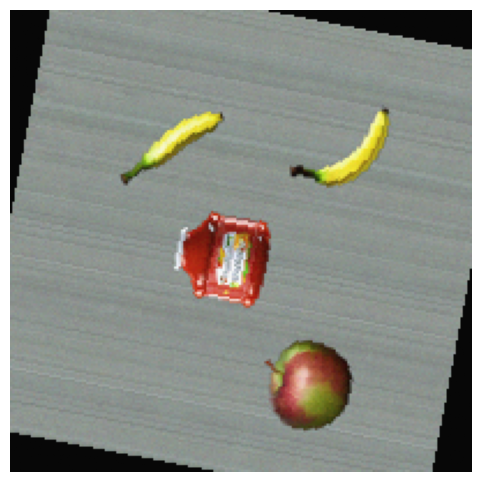

tensor([0.1435, 1.8920, 3.1718]) tensor([0., 2., 3.])


<Figure size 640x480 with 0 Axes>

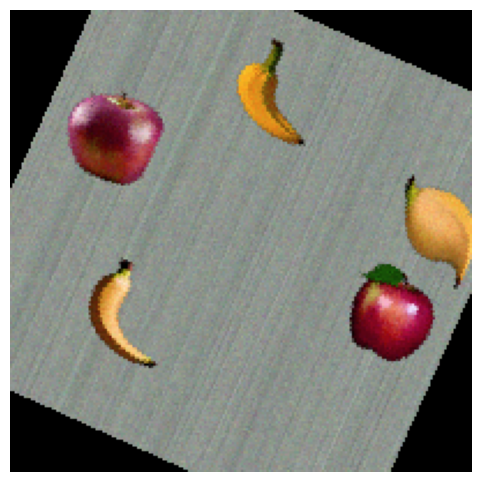

tensor([1.9548, 0.0450, 1.1475]) tensor([2., 0., 1.])


<Figure size 640x480 with 0 Axes>

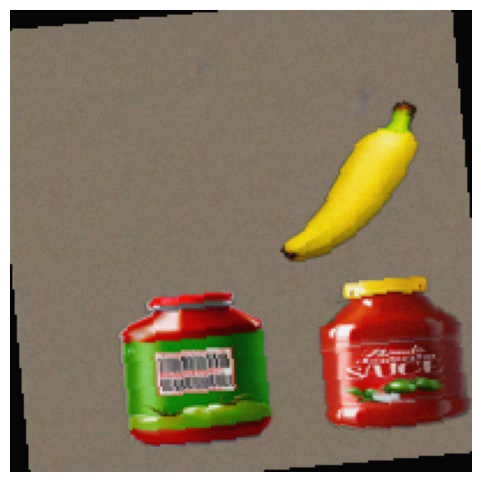

tensor([0.9414, 0.0319, 0.0120]) tensor([1., 0., 0.])


<Figure size 640x480 with 0 Axes>

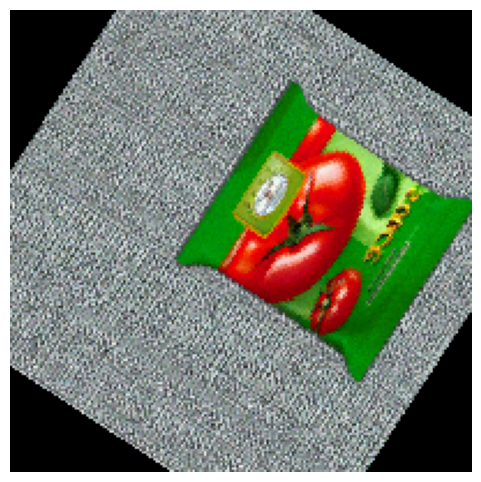

tensor([2.2717, 0.9240, 2.1589]) tensor([2., 1., 2.])


<Figure size 640x480 with 0 Axes>

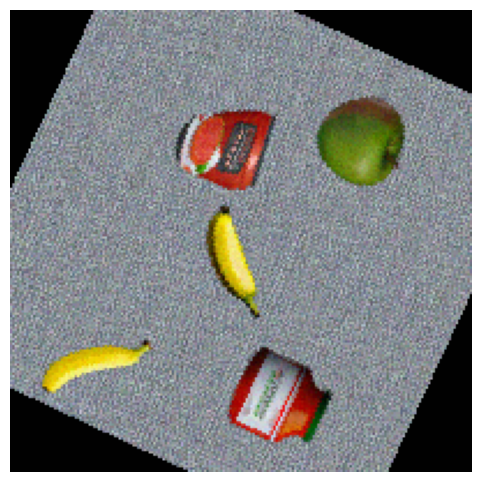

tensor([0.0157, 0.9081, 2.8351]) tensor([0., 1., 3.])


<Figure size 640x480 with 0 Axes>

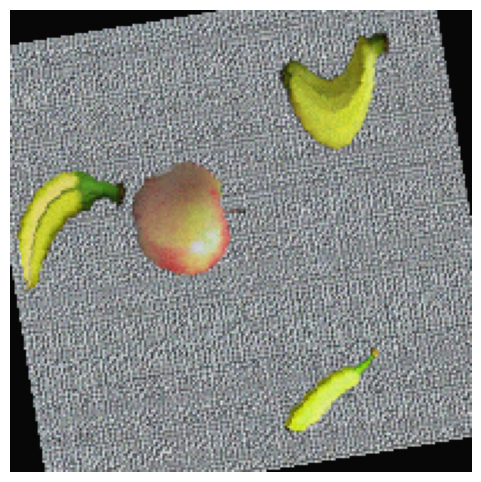

tensor([0.0071, 0.0331, 0.9989]) tensor([0., 0., 1.])


<Figure size 640x480 with 0 Axes>

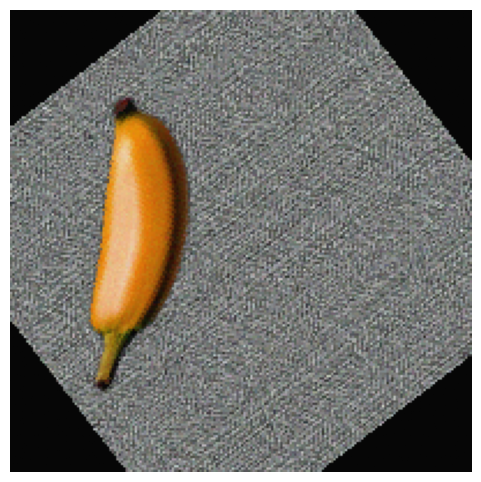

tensor([-0.0196,  0.0657,  1.8115]) tensor([0., 0., 2.])


<Figure size 640x480 with 0 Axes>

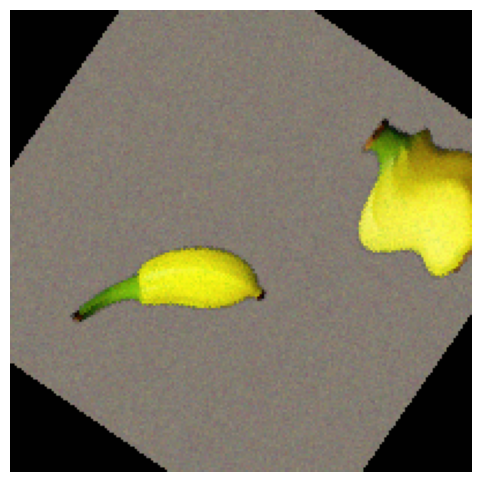

tensor([ 0.8930, -0.0074,  1.0742]) tensor([1., 0., 1.])


<Figure size 640x480 with 0 Axes>

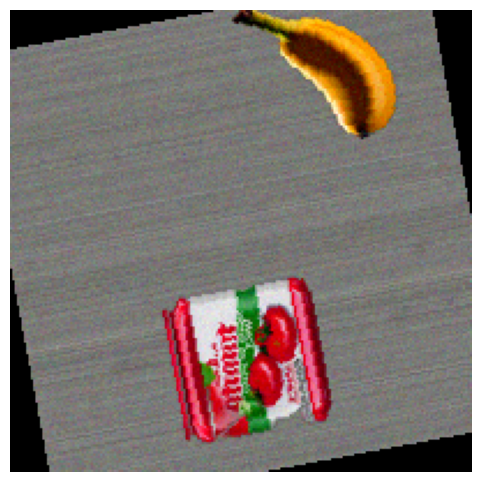

tensor([-0.0165,  0.0324,  1.0359]) tensor([0., 0., 1.])


<Figure size 640x480 with 0 Axes>

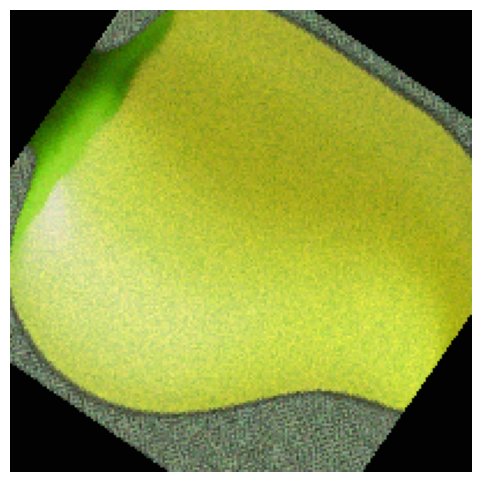

tensor([ 0.0102,  0.8921, -0.0069]) tensor([0., 1., 0.])


<Figure size 640x480 with 0 Axes>

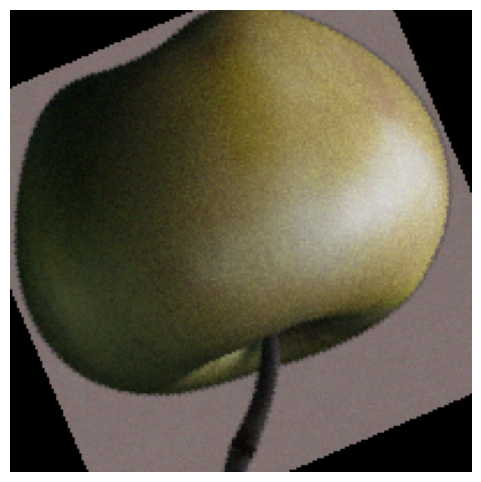

tensor([ 0.9699,  0.0060, -0.0029]) tensor([1., 0., 0.])


<Figure size 640x480 with 0 Axes>

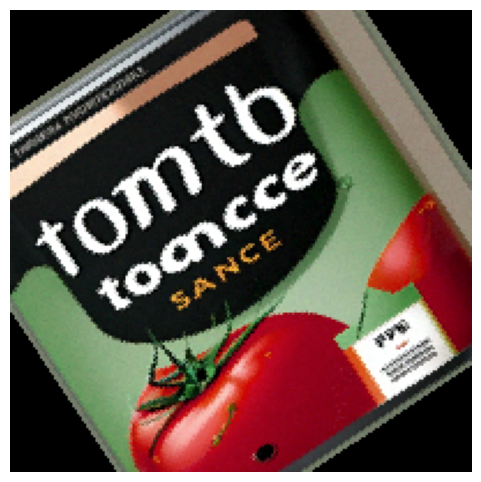

tensor([-0.0045,  0.8806,  0.0148]) tensor([0., 1., 0.])


<Figure size 640x480 with 0 Axes>

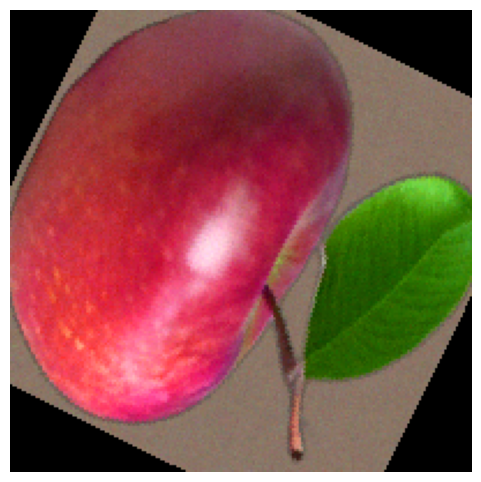

tensor([1.0012, 0.0123, 0.0010]) tensor([1., 0., 0.])


<Figure size 640x480 with 0 Axes>

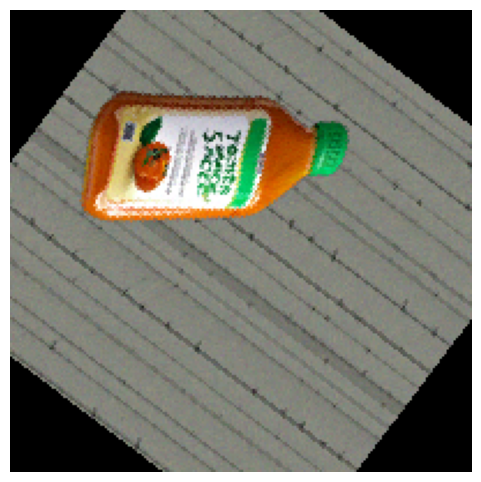

An error occurred: division by zero


epoch,▁▁▂▂▂▂▂▃▃▄▄▄▅▅▅▅▅▆▆▇▇▇▇▇█
test_loss,▁
test_mae,▁
test_mse,▁
train_loss_epoch,█▃▂▂▁▁▁▁▁▁
train_loss_step,█▅▁▁
train_mae_epoch,█▄▃▃▂▂▂▁▁▁
train_mae_step,█▅▁▁
train_mse_epoch,█▃▂▂▁▁▁▁▁▁
train_mse_step,█▅▁▁
trainer/global_step,▁▁▂▂▂▃▃▃▄▄▄▅▅▆▆▆▆▇▇▇████████████████████


<Figure size 640x480 with 0 Axes>

In [17]:
model = TrainModel(getEfficientnetRegression())
model.to(device)
#summary(model, input_size=(3, 200, 200))

wandb_logger = configure_wandb(additional_name="_Efficientnet-classifier-generated_images", tags=["Efficientnet", "classifier"])


checkpoint_callback = ModelCheckpoint(
    monitor='val_mae',   # Track validation loss
    dirpath='checkpoints/classifier',  # Directory to save checkpoints
    filename=wandb_logger.experiment.name,  # Checkpoint file name
    save_top_k=1,  # Save only the best model (lowest val_loss)
    mode='min',  # We are minimizing validation loss
)

early_stopping = EarlyStopping(
    monitor="val_mae",  
    mode="min",      
    min_delta=0.01,
    patience=15,          
)


try:
    trainer = pl.Trainer(max_epochs=10, logger=wandb_logger, callbacks=[checkpoint_callback, early_stopping], fast_dev_run=False, accelerator=str(device), devices=1)

    trainer.fit(model, train_loader, val_loader) 

    # Load the best model for testing
    trainer.test(model, test_loader, ckpt_path=checkpoint_callback.best_model_path)

    show_predictions_with_prices_and_manual_metrics(model, test_dataset)
except Exception as e:
    print(f"An error occurred: {e}")

finally:
    wandb.finish()


In [16]:
trainer.test(model, test_loader, ckpt_path=checkpoint_callback.best_model_path)


Restoring states from the checkpoint path at /home/torgeschwark/TinyML-MT/test_aproaches/checkpoints/classifier/generated_images_Efficientnet-classifier-generated_images_30Jan-15:13:41.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


UsageError: Run (j8dcybs4) is finished. The call to `_config_callback` will be ignored. Please make sure that you are using an active run.